# Biblioteka PYTHON - MATPLOTLIB


* <a href="#et1">Wstęp </a>
* <a href="#et2">Rozmiary, proporcja i DPI </a>
* <a href="#et3">Nagrywanie rysunków na dysku </a>
* <a href="#et4">Legenda, etykiety i tytuły </a>
* <a href="#et5">Kolory, grubość linii i typ linii </a>
* <a href="#et6">Osie  </a>
* <a href="#et7">Siatka na wykresie </a>
* <a href="#et8">Inne typy wykresów 2D </a>
* <a href="#et9">Podpisywanie linii na wykresie </a>
* <a href="#et10">Ręczne dodawanie wykresów wewnątrz wykresów </a>
* <a href="#et11">Mapa kolorów i mapa konturów </a>
* <a href="#et12">Wykresy 3D </a>
* <a href="#et13">Animacje </a>
* <a href="#et14">Ciekawsze zastosowania MATPLOTLIBa </a>
    * <a href="#et15">Fraktal Mandelbrota </a>
    * <a href="#et16">Analiza giełdy </a>
* <a href="#et17">Tabele kształtów i palety kolorów MATPLOTLIB </a>


In [5]:
# W tej linii konfigurujemy MATPLOTLIB tak aby nie otwierał nowego okna dla każdego obiektu
# tylko wyświetlał wszystko w tym notesie 
%matplotlib inline

## <a name="et1"></a>Wstęp

Matplotlib jest biblioteką graficzną 2D i 3D przeznaczoną do ilustracji naukowych obliczeń. Główne zalety biblioteki matplotlib to: 

* Łatwo zacząć pracę w tej bibliotece 
* Utrzymuje standart $\LaTeX$a dla etykiet i tekstu 
* Łatwo kontrolować każdy element wykresu łącznie z jego rozmiarem i DPI 
* Wyjściem są pliki o wysokiej jakości w wielu formatach takich jak PNG, PDF, SVG, EPS, i PGF.
* GUI dla interaktywnego badania wykresów 

Ważne - wszystkie aspekty rysunku mogą być kontrolowane "programowo". Więcj informacji jak również 
galeria zobacz: http://matplotlib.org/

Matplotlib wymaga dużej liczby zależnych bibliotek:

* NumPy (>= 1.7.1)
* setuptools
* dateutil (>= 2.1)
* pyparsing
* libpng (>= 1.2)
* pytz
* FreeType (>= 2.3)
* cycler (>= 0.10.0)
* six
* backports.functools_lru_cache (dla Python 2.7 tylko)
* subprocess32 (dla Python 2.7 tylko na Linux i macOS)

Dla utrzymania lepszej animacji i formatowania wykresów powinieneś zainstalować:

ffmpeg/avconv: for saving movies;
ImageMagick: for saving animated gifs;
Pillow (>=2.0): for a larger selection of image file formats: JPEG, BMP, and TIFF image files;
LaTeX and GhostScript (for rendering text with LaTeX).

Aby zacząć pracę z Matplotlibem należy na początku albo zaimportować moduł `pylab`

In [6]:
from pylab import *

albo zaimportować moduł `matplotlib.pyplot` pod skróconą nazwą `plt` (powiedzmy):

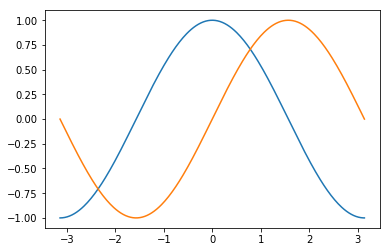

In [7]:
""" PY-01 Druk wykresów wg domyślnych ustawień """
import matplotlib
import matplotlib.pyplot as plt
import numpy as np

X = np.linspace(-np.pi, np.pi, 256, endpoint=True)
C, S = np.cos(X), np.sin(X)

plt.plot(X, C)
plt.plot(X, S)

plt.show()


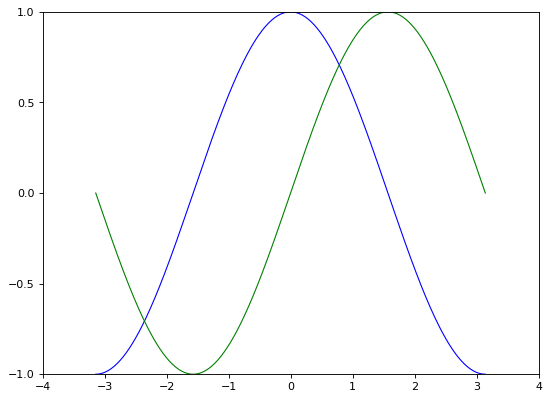

In [8]:
""" Ustawienia domyślne parametrów wykresu """
import numpy as np
import matplotlib.pyplot as plt

# Twórz rysunek rozmiaru 8x6 inches, 80 dots na inch
plt.figure(figsize=(8, 6), dpi=80)

# Twórz nowy subplot w siatce 1x1
plt.subplot(1, 1, 1)

X = np.linspace(-np.pi, np.pi, 256, endpoint=True)
C, S = np.cos(X), np.sin(X)

#  Wyrysuj cosinus linią niebieską ciągłą grubości 1 (pixels)
plt.plot(X, C, color="blue", linewidth=1.0, linestyle="-")

#  Wyrysuj sinus linią zieloną ciągłą grubości  1 (pixels)
plt.plot(X, S, color="green", linewidth=1.0, linestyle="-")

# Ustaw granice x (OX)
plt.xlim(-4.0, 4.0)

# Ustaw znaczki dla  x 
plt.xticks(np.linspace(-4, 4, 9, endpoint=True))

# Ustaw granice y 
plt.ylim(-1.0, 1.0)

# Ustaw znaczki dla  y 
plt.yticks(np.linspace(-1, 1, 5, endpoint=True))

# Nagraj rysunek z rozdzielczością 72 dots na inch
# plt.savefig("exercice_2.png", dpi=72)

# Pokaż wynik na ekranie
plt.show()

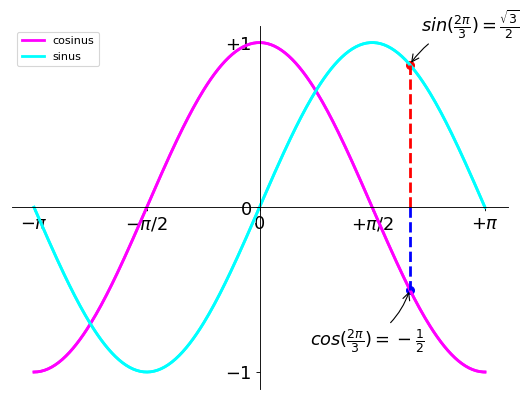

In [9]:
""" PY-02 Nasze ustawienia parametrów wykresu """
import numpy as np
import matplotlib.pyplot as plt

# Twórz rysunek rozmiaru 8x6 inches, 80 dots na inch
plt.figure(figsize=(8, 6), dpi=80)

# Twórz nowy subplot w siatce 1x1
plt.subplot(1, 1, 1)

X = np.linspace(-np.pi, np.pi, 256, endpoint=True)
C, S = np.cos(X), np.sin(X)

#  Zmieniamy kolory, grubość 
plt.plot(X, C, color="magenta", linewidth=2.5, linestyle="-")
plt.plot(X, S, color="cyan",  linewidth=2.5, linestyle="-")

# Ustawiamy inne granice x i y
plt.xlim(X.min() * 1.1, X.max() * 1.1)
plt.ylim(C.min() * 1.1, C.max() * 1.1)

# Ustaw znaczki dla  x i y 
plt.xticks([-np.pi, -np.pi/2, 0, np.pi/2, np.pi],
          [r'$-\pi$', r'$-\pi/2$', r'$0$', r'$+\pi/2$', r'$+\pi$'])

plt.yticks([-1, 0, +1],
          [r'$-1$', r'$0$', r'$+1$'])

# Usuń spiny
ax = plt.gca()  # gca stands for 'get current axis'
ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.xaxis.set_ticks_position('bottom')
ax.spines['bottom'].set_position(('data',0))
ax.yaxis.set_ticks_position('left')
ax.spines['left'].set_position(('data',0))

# Dodaj legendę
plt.plot(X, C, color="magenta", linewidth=2.5, linestyle="-", label="cosinus")
plt.plot(X, S, color="cyan",  linewidth=2.5, linestyle="-", label="sinus")

plt.legend(loc='upper left')

# Dodaj wyróżnione punkty
t = 2 * np.pi / 3
plt.plot([t, t], [0, np.cos(t)], color='blue', linewidth=2.5, linestyle="--")
plt.scatter([t, ], [np.cos(t), ], 50, color='blue')

plt.annotate(r'$sin(\frac{2\pi}{3})=\frac{\sqrt{3}}{2}$',
             xy=(t, np.sin(t)), xycoords='data',
             xytext=(+10, +30), textcoords='offset points', fontsize=16,
             arrowprops=dict(arrowstyle="->", connectionstyle="arc3,rad=.2"))

plt.plot([t, t],[0, np.sin(t)], color='red', linewidth=2.5, linestyle="--")
plt.scatter([t, ],[np.sin(t), ], 50, color='red')

plt.annotate(r'$cos(\frac{2\pi}{3})=-\frac{1}{2}$',
             xy=(t, np.cos(t)), xycoords='data',
             xytext=(-90, -50), textcoords='offset points', fontsize=16,
             arrowprops=dict(arrowstyle="->", connectionstyle="arc3,rad=.2"))

# Przepisz etykiety na osi
for label in ax.get_xticklabels() + ax.get_yticklabels():
    label.set_fontsize(16)
    label.set_bbox(dict(facecolor='white', edgecolor='None', alpha=0.65))



# Pokaż wynik na ekranie
plt.show()

## MATLABowe API

Przyglądając się bliżej tym poszczegolnym poleceniom widzimy, że tworzenie wykresow jest bliźniaczo podobne do tego procesu 
w MATLABie i R. Kompatybilność nie jest przypadkowa. W szczególności podkreśla to następujący przykład:

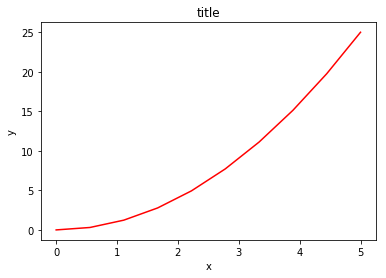

In [10]:
""" PY-03 MATLABowskie API """
from pylab import *
x = np.linspace(0, 5, 10)
y = x ** 2
figure()
plot(x, y, 'r')
xlabel('x')
ylabel('y')
title('title')
show()

Większość funkcji rysowania związanych z MATLABem realizuje również moduł `pylab`. Dotyczy to w szczegolności: subplot i wyboru koloów:

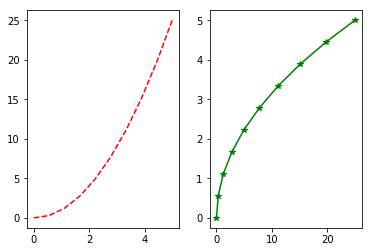

In [11]:
""" PY-04 Ilustracja subplot """
from pylab import *
x = np.linspace(0, 5, 10)
y = x ** 2
subplot(1,2,1)
plot(x, y, 'r--')
subplot(1,2,2)
plot(y, x, 'g*-');

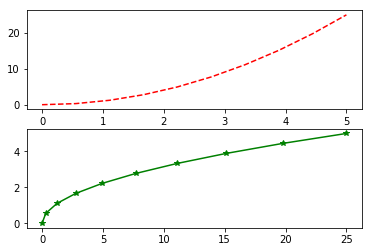

In [12]:
""" PY-05 Ilustracja subplot """
from pylab import *

subplot(2,1,1)
plot(x, y, 'r--')
subplot(2,1,2)
plot(y, x, 'g*-')


# plt.savefig('../figures/subplot-horizontal.png', dpi=64)
show()

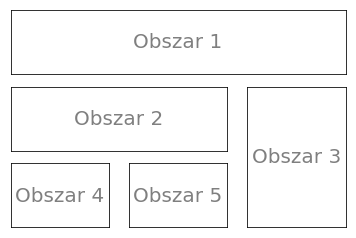

In [13]:
""" PY-06 Inny podział na obszary subplot """
from pylab import *
import matplotlib.gridspec as gridspec

G = gridspec.GridSpec(3, 3)

axes_1 = subplot(G[0, :])
xticks([]), yticks([])
text(0.5,0.5, 'Obszar 1',ha='center',va='center',size=20,alpha=.5)

axes_2 = subplot(G[1,:-1])
xticks([]), yticks([])
text(0.5,0.5, 'Obszar 2',ha='center',va='center',size=20,alpha=.5)

axes_3 = subplot(G[1:, -1])
xticks([]), yticks([])
text(0.5,0.5, 'Obszar 3',ha='center',va='center',size=20,alpha=.5)

axes_4 = subplot(G[-1,0])
xticks([]), yticks([])
text(0.5,0.5, 'Obszar 4',ha='center',va='center',size=20,alpha=.5)

axes_5 = subplot(G[-1,-2])
xticks([]), yticks([])
text(0.5,0.5, 'Obszar 5',ha='center',va='center',size=20,alpha=.5)

show()

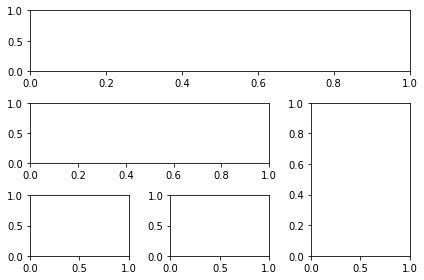

In [27]:
""" PY-06 Inny podział na obszary subplot """
from pylab import *
import matplotlib.gridspec as gridspec

fig = plt.figure()
ax1 = plt.subplot2grid((3,3), (0,0), colspan=3)
ax2 = plt.subplot2grid((3,3), (1,0), colspan=2)
ax3 = plt.subplot2grid((3,3), (1,2), rowspan=2)
ax4 = plt.subplot2grid((3,3), (2,0))
ax5 = plt.subplot2grid((3,3), (2,1))
fig.tight_layout()

## Matplotlibowe  API

Różnica polega na tym, że w MATLABowym API mamy obiekt a jego atrybuty nie powinny być zmieniane globalnie. Powinniśmy raczej mieć różne metody i atrybuty różnych obiektów (enkapsulacja) i to jest istota Matplotlibowego API. Różnica stanie się oczywistsza gdy będziemy mieć do czynienia z różnymi figurami i obiektami i różnymi subplotami. 

Teraz tworzymy obiekt `fig` i dla niego tworzymy nową instancję osi `axes` używając metody `add_axes` klasy `figure`. 

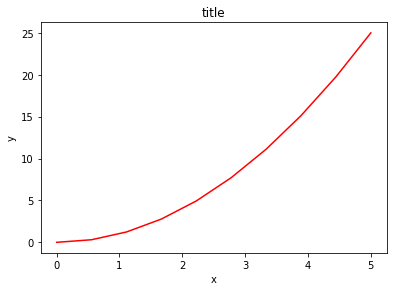

In [14]:
""" PY-07 Matplotlibowe API """
fig = plt.figure()

axes = fig.add_axes([0.1, 0.1, 0.8, 0.8]) # left, bottom, width, height (range 0 to 1)

axes.plot(x, y, 'r')

axes.set_xlabel('x')
axes.set_ylabel('y')
axes.set_title('title');

Tutaj tworzymy dwa obiekty klasy `figure` i dwie instancje `axes` dla tych obiektów odpowiedznio:

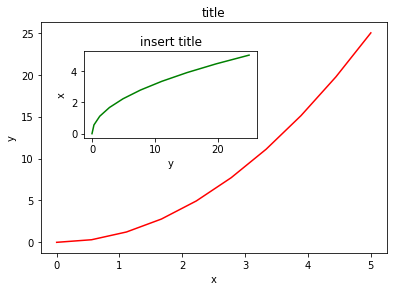

In [15]:
""" PY-08 Dwa obiekty figure"""
fig = plt.figure()

axes1 = fig.add_axes([0.1, 0.1, 0.8, 0.8]) # main axes
axes2 = fig.add_axes([0.2, 0.5, 0.4, 0.3]) # inset axes

# main figure
axes1.plot(x, y, 'r')
axes1.set_xlabel('x')
axes1.set_ylabel('y')
axes1.set_title('title')

# insert
axes2.plot(y, x, 'g')
axes2.set_xlabel('y')
axes2.set_ylabel('x')
axes2.set_title('insert title');

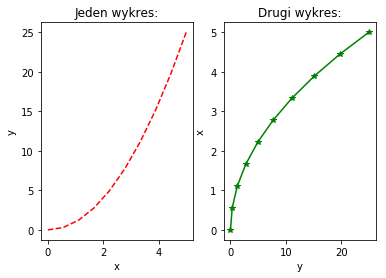

In [16]:
""" PY-09 Przykład rysowania obiektow w pętli"""
from pylab import *
x = np.linspace(0, 5, 10)
y = x ** 2

fig, axes = plt.subplots(nrows=1, ncols=2)
param=[(x,y,'r--'),(y,x,'g*-')]
title=['Jeden wykres:','Drugi wykres:']
xlab=['x','y']
ylab=['y','x']

for i in range(2):
    axes[i].plot(*param[i])
    axes[i].set_xlabel(xlab[i])
    axes[i].set_ylabel(ylab[i])
    axes[i].set_title(title[i])

### <a name="et2"></a>Rozmiary, proporcja i DPI rysunków

Są to atrybuty obiektu `figure`:

* `figsize` - krotka zawierająca długość i szerokość wykresu w calach (inch)
* `dpi` - ilość pikseli na cal 

Atrybuty te przechodzą do obiektu subplot. 

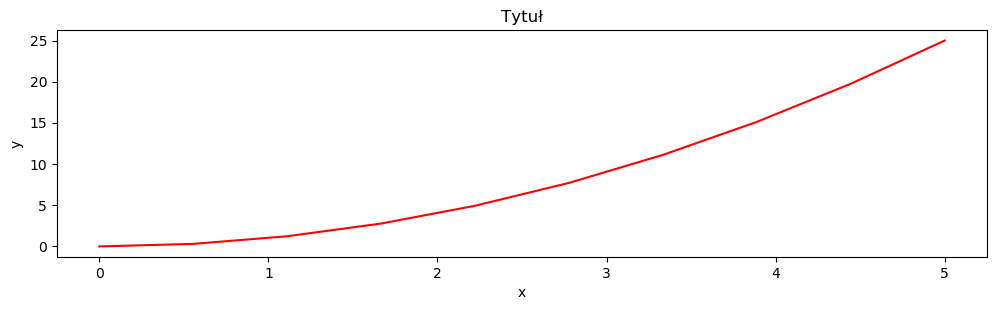

In [17]:
""" PY-10 Wykres spłaszczony o rozdz. 100 dpi"""
fig, axes = plt.subplots(figsize=(12,3), dpi=100)

axes.plot(x, y, 'r')
axes.set_xlabel('x')
axes.set_ylabel('y')
axes.set_title('Tytuł');

### <a name="et3"></a>Nagrywanie na dysku rysunków

Służy do tego metoda obiektu `figure` : savefig. Jako parametr podajemy nazwę zbioru i opcjonalnie dpi, np:

fig.savefig("rysunek.png",dpi=200)

Dopuszczalne formaty zachowujące najlepszą jakość to: PNG, JPG, EPS, SVG, PGF i PDF 

### <a name="et4"></a>Legenda, etykiety i tytuły

Jak widać na przykładzie PY-10 etykietę osi OX, OY i tytuł wykresu ustawiamy w Matplolibie za pomocą metod:

**axes.set_xlabel('x')**

**axes.set_ylabel('y')**

**axes.set_title('Tytuł');**

natomiast legendę tworzymy albo poleceniem 

**ax.legend(\["curve1", "curve2", "curve3"\]);**

albo dorzucając opcję label w poleceniu plot

**ax.plot(x, x\**2, label="y = x\**2")**

Lokalizacja legendy może byc następująca:

**ax.legend(loc=0)                     # matplotlib decyduje 
ax.legend(loc=1)                       # górny prawy róg
ax.legend(loc=2)                       # górny lewy róg
ax.legend(loc=3)                       # dolny lewy róg
ax.legend(loc=4)                       # dolny prawy róg 
.. i wiele innych opcji** 


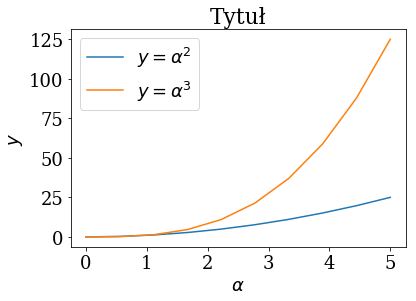

In [18]:
""" PY-11 Legenda i podpisy osi"""
matplotlib.rcParams.update({'font.size': 18, 'font.family': 'serif'})  # Globalne ustawienia fontu
fig, ax = plt.subplots()

ax.plot(x, x**2, label=r"$y = \alpha^2$")   # $..$ formatowanie LATEXem - musi to być surowy łańcuch r
ax.plot(x, x**3, label=r"$y = \alpha^3$")
ax.legend(loc=2)                           # górny lewy róg
ax.set_xlabel(r'$\alpha$', fontsize=18)
ax.set_ylabel(r'$y$', fontsize=18)
ax.set_title('Tytuł');

Ładnym fontem jest font STIX:

**matplotlib.rcParams.update({'font.size': 18, 'font.family': 'STIXGeneral', 'mathtext.fontset': 'stix'})**

lub możemy też użyć fontów $LATEX$owych:

**matplotlib.rcParams.update({'font.size': 18, 'text.usetex': True})** 

Odewróceniem tego ostatniego ustawienia jest:

**matplotlib.rcParams.update({'font.size': 12, 'font.family': 'sans', 'text.usetex': False})**


### <a name="et5"></a>Kolory, grubość linii i typ linii

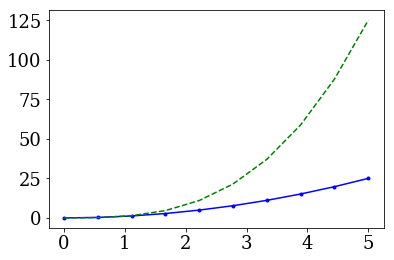

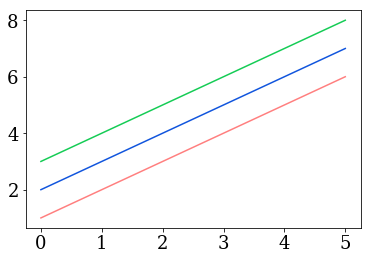

In [19]:
""" PY-12 Ustawienie kolorów w stylu MATLABa 'b'-blue, 'g'-green .-punkty -kreski """
from pylab import *
x = np.linspace(0, 5, 10)

fig, ax = plt.subplots()
ax.plot(x, x**2, 'b.-')            # niebieska linia złożona z punktów
ax.plot(x, x**3, 'g--')            # zielona linia złożona z kresek

""" Ustawienie kolorów w stylu Matploliba """
fig, ax = plt.subplots()
ax.plot(x, x+1, color="red", alpha=0.5) # half-transparant red
ax.plot(x, x+2, color="#1155dd")        # RGB hex code for a bluish color
ax.plot(x, x+3, color="#15cc55")        # RGB hex code for a greenish color


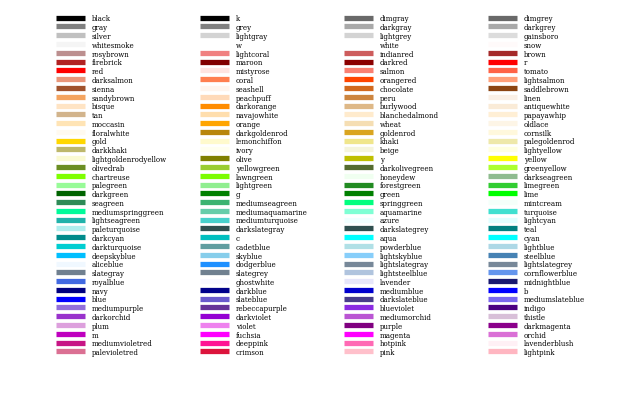

In [20]:
""" PY-13 Program wyświetla mnemoniki kolorów """
from __future__ import division

import matplotlib.pyplot as plt
from matplotlib import colors as mcolors


colors = dict(mcolors.BASE_COLORS, **mcolors.CSS4_COLORS)

# Uporządkuj kolory wg. nazwy
by_hsv = sorted((tuple(mcolors.rgb_to_hsv(mcolors.to_rgba(color)[:3])), name)
                for name, color in colors.items())
sorted_names = [name for hsv, name in by_hsv]

n = len(sorted_names)
ncols = 4
nrows = n // ncols + 1

fig, ax = plt.subplots(figsize=(8, 5))

# Get height and width
X, Y = fig.get_dpi() * fig.get_size_inches()
h = Y / (nrows + 1)
w = X / ncols

for i, name in enumerate(sorted_names):
    col = i % ncols
    row = i // ncols
    y = Y - (row * h) - h

    xi_line = w * (col + 0.05)
    xf_line = w * (col + 0.25)
    xi_text = w * (col + 0.3)

    ax.text(xi_text, y, name, fontsize=(h * 0.8),
            horizontalalignment='left',
            verticalalignment='center')

    ax.hlines(y + h * 0.1, xi_line, xf_line,
              color=colors[name], linewidth=(h * 0.6))

ax.set_xlim(0, X)
ax.set_ylim(0, Y)
ax.set_axis_off()

fig.subplots_adjust(left=0, right=1,
                    top=1, bottom=0,
                    hspace=0, wspace=0)
plt.show()

#### Linie i znaczki na liniach 

Grubość linii sygnalizuje argument `linewidth` lub w skrócie `lw`, styl linii to `linestyle` lub `ls`:

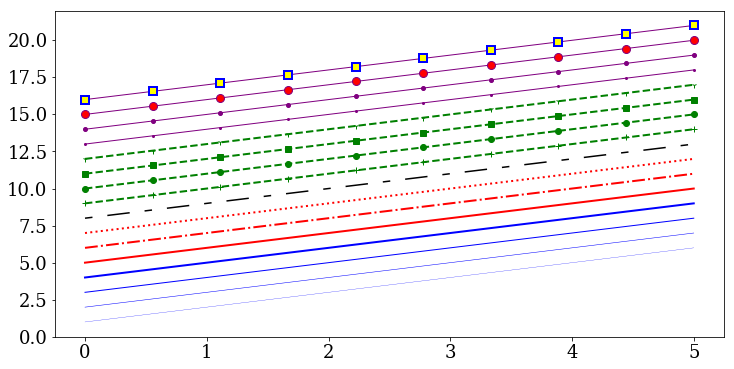

In [21]:
""" PY-14 Linie i znaczki na liniach """
from pylab import *
x = np.linspace(0, 5, 10)

fig, ax = plt.subplots(figsize=(12,6))

ax.plot(x, x+1, color="blue", linewidth=0.25)
ax.plot(x, x+2, color="blue", linewidth=0.50)
ax.plot(x, x+3, color="blue", linewidth=1.00)
ax.plot(x, x+4, color="blue", linewidth=2.00)

# possible linestype options ‘-‘, ‘--’, ‘-.’, ‘:’, ‘steps’
ax.plot(x, x+5, color="red", lw=2, linestyle='-')
ax.plot(x, x+6, color="red", lw=2, ls='-.')
ax.plot(x, x+7, color="red", lw=2, ls=':')

# custom dash
line, = ax.plot(x, x+8, color="black", lw=1.50)
line.set_dashes([5, 10, 15, 10]) # format: line length, space length, ...

# possible marker symbols: marker = '+', 'o', '*', 's', ',', '.', '1', '2', '3', '4', ...
ax.plot(x, x+ 9, color="green", lw=2, ls='--', marker='+')
ax.plot(x, x+10, color="green", lw=2, ls='--', marker='o')
ax.plot(x, x+11, color="green", lw=2, ls='--', marker='s')
ax.plot(x, x+12, color="green", lw=2, ls='--', marker='1')

# marker size and color
ax.plot(x, x+13, color="purple", lw=1, ls='-', marker='o', markersize=2)
ax.plot(x, x+14, color="purple", lw=1, ls='-', marker='o', markersize=4)
ax.plot(x, x+15, color="purple", lw=1, ls='-', marker='o', markersize=8, markerfacecolor="red")
ax.plot(x, x+16, color="purple", lw=1, ls='-', marker='s', markersize=8, 
        markerfacecolor="yellow", markeredgewidth=2, markeredgecolor="blue");

### <a name="et6"></a>Wyświetlanie osi

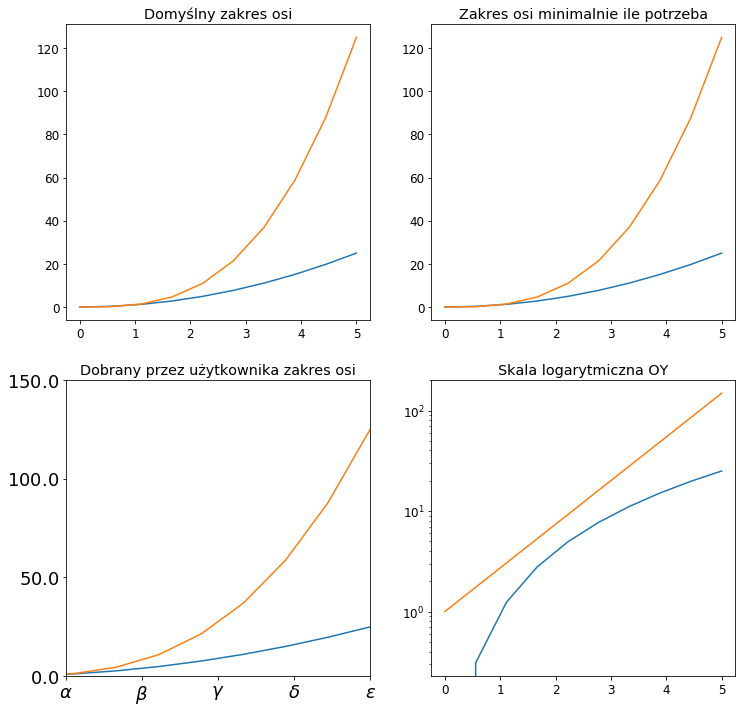

In [39]:
""" PY-15 Osie """
from pylab import *
import numpy as np
matplotlib.rcParams.update({'font.size': 12, 'font.family': 'sans', 'text.usetex': False})

x = np.linspace(0, 5, 10)

fig, axes = plt.subplots(2, 2, figsize=(12, 12))

axes[0,0].plot(x, x**2, x, x**3)
axes[0,0].set_title("Domyślny zakres osi")

axes[0,1].plot(x, x**2, x, x**3)
axes[0,1].axis('tight')
axes[0,1].set_title("Zakres osi minimalnie ile potrzeba")

axes[1,0].plot(x, x**2, x, x**3)
axes[1,0].set_ylim([0, 60])
axes[1,0].set_xlim([2, 5])
axes[1,0].set_title("Dobrany przez użytkownika zakres osi")
axes[1,0].set_xticks([1, 2, 3, 4, 5])
axes[1,0].set_xticklabels([r'$\alpha$', r'$\beta$', r'$\gamma$', r'$\delta$', r'$\epsilon$'], fontsize=18)
yticks = [0, 50, 100, 150]
axes[1,0].set_yticks(yticks)
axes[1,0].set_yticklabels(["$%.1f$" % y for y in yticks], fontsize=18);         # Formatowanie w stylu LaTeXa

axes[1,1].plot(x, x**2, x, np.exp(x))
axes[1,1].set_yscale("log")
axes[1,1].set_title("Skala logarytmiczna OY");

Przykład ustalania przestrzeni dla podpisów na osi:

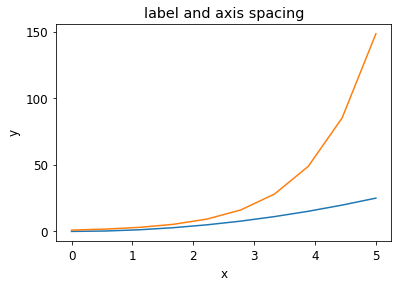

In [40]:
""" PY-16 Jeszcze osie"""
# distance between x and y axis and the numbers on the axes
matplotlib.rcParams['xtick.major.pad'] = 5
matplotlib.rcParams['ytick.major.pad'] = 5

fig, ax = plt.subplots(1, 1)
      
ax.plot(x, x**2, x, np.exp(x))
ax.set_yticks([0, 50, 100, 150])

ax.set_title("label and axis spacing")

# padding between axis label and axis numbers
ax.xaxis.labelpad = 5
ax.yaxis.labelpad = 5

ax.set_xlabel("x")
ax.set_ylabel("y");

In [41]:
# restore defaults
matplotlib.rcParams['xtick.major.pad'] = 3
matplotlib.rcParams['ytick.major.pad'] = 3

### <a name="et7"></a> Siatka na wykresie

uzyskujemy ją stosując metodę **grid**

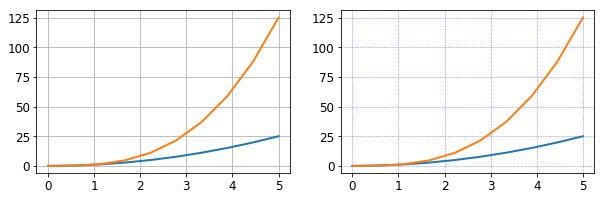

In [42]:
""" PY-17 Siatka na wykresie """
from pylab import *
import numpy as np

x = np.linspace(0, 5, 10)

fig, axes = plt.subplots(1, 2, figsize=(10,3))

# default grid appearance
axes[0].plot(x, x**2, x, x**3, lw=2)
axes[0].grid(True)

# custom grid appearance
axes[1].plot(x, x**2, x, x**3, lw=2)
axes[1].grid(color='b', alpha=0.5, linestyle='dashed', linewidth=0.5)

Przykład sterowania wyświetlaniem i  kolorami osi

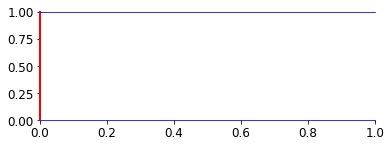

In [43]:
""" PY-18 Osie"""
fig, ax = plt.subplots(figsize=(6,2))

ax.spines['bottom'].set_color('blue')
ax.spines['top'].set_color('blue')

ax.spines['left'].set_color('red')
ax.spines['left'].set_linewidth(2)

# turn off axis spine to the right
ax.spines['right'].set_color("none")
ax.yaxis.tick_left() # only ticks on the left side

a tutaj sterujemy grubością osi 

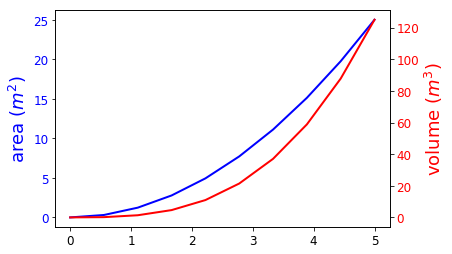

In [44]:
""" PY-19 Grubość osi """
fig, ax1 = plt.subplots()

ax1.plot(x, x**2, lw=2, color="blue")
ax1.set_ylabel(r"area $(m^2)$", fontsize=18, color="blue")
for label in ax1.get_yticklabels():
    label.set_color("blue")
    
ax2 = ax1.twinx()
ax2.plot(x, x**3, lw=2, color="red")
ax2.set_ylabel(r"volume $(m^3)$", fontsize=18, color="red")
for label in ax2.get_yticklabels():
    label.set_color("red")

Tutaj jest przykład wykresy gdzie "górna" (top) i "prawa" (right) oś nie jest wyświetlata a pozostałe osie wyświeltane są dla wartości x i y rownych 0:

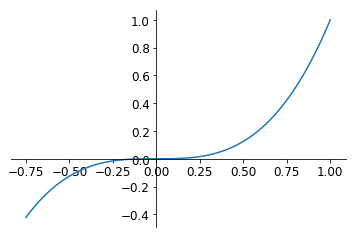

In [45]:
""" PY-20 Osie przcibające się w (0,0)"""
fig, ax = plt.subplots()

ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')

ax.xaxis.set_ticks_position('bottom')
ax.spines['bottom'].set_position(('data',0)) # set position of x spine to x=0

ax.yaxis.set_ticks_position('left')
ax.spines['left'].set_position(('data',0))   # set position of y spine to y=0

xx = np.linspace(-0.75, 1., 100)
ax.plot(xx, xx**3);

### <a name="et8"></a>Inne typy 2D wykresów

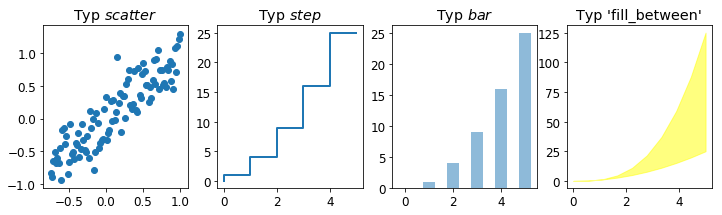

In [46]:
""" PY-21 Inne typy wykresów 2D """
from pylab import *
import numpy as np

x = np.linspace(0, 5, 10)
n = np.array([0,1,2,3,4,5])
xx = np.linspace(-0.75, 1., 100)

fig, axes = plt.subplots(1, 4, figsize=(12,3))

axes[0].scatter(xx, xx + 0.25*np.random.randn(len(xx)))
axes[0].set_title("Typ $scatter$")

axes[1].step(n, n**2, lw=2)
axes[1].set_title("Typ $step$")

axes[2].bar(n, n**2, align="center", width=0.5, alpha=0.5)
axes[2].set_title("Typ $bar$")

axes[3].fill_between(x, x**2, x**3, color="yellow", alpha=0.5);
axes[3].set_title("Typ 'fill_between'");

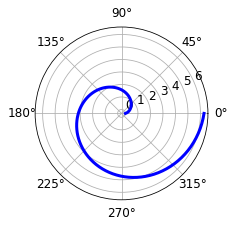

In [47]:
""" PY-22 Typ polar (współrzędne biegunowe) """
from pylab import *
import numpy as np

fig = plt.figure()
ax = fig.add_axes([0.0, 0.0, .6, .6], polar=True)
t = np.linspace(0, 2 * np.pi, 100)
ax.plot(t, t, color='blue', lw=3);

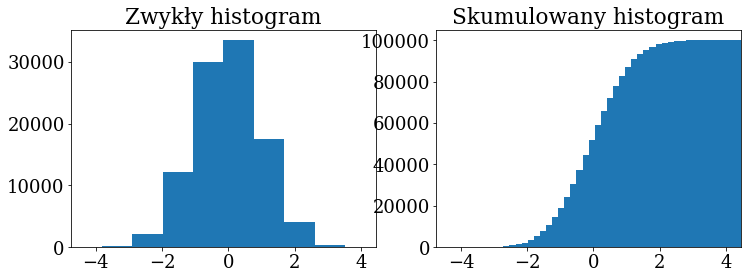

In [31]:
""" PY-23 Histogram   """
from pylab import *
import numpy as np

n = np.random.randn(100000)
fig, axes = plt.subplots(1, 2, figsize=(12,4))

axes[0].hist(n)
axes[0].set_title("Zwykły histogram")
axes[0].set_xlim((min(n), max(n)))

axes[1].hist(n, cumulative=True, bins=50)
axes[1].set_title("Skumulowany histogram")
axes[1].set_xlim((min(n), max(n)));

### <a name="et9"></a>Podpisanie wykresów

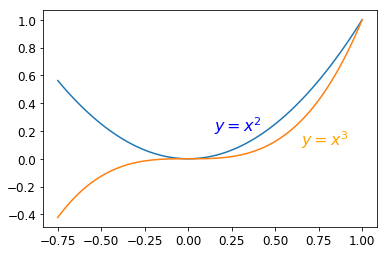

In [48]:
""" PY-24 Podpisywanie wykresów"""
from pylab import *
import numpy as np

x = np.linspace(0, 5, 10)
n = np.array([0,1,2,3,4,5])
xx = np.linspace(-0.75, 1., 100)

fig, ax = plt.subplots()

ax.plot(xx, xx**2, xx, xx**3)

ax.text(0.15, 0.2, r"$y=x^2$", fontsize=16, color="blue")
ax.text(0.65, 0.1, r"$y=x^3$", fontsize=16, color="orange");

#### <a name="et10"></a>Ręczne dodanie wykresu wewnątrz innego wykresu

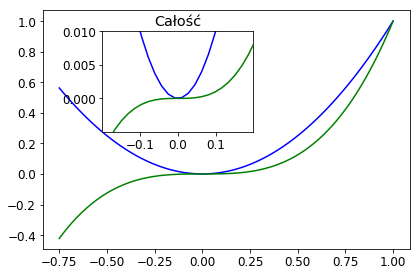

In [50]:
""" PY-25 Wykres w wykresie"""
from pylab import *
import numpy as np


x = np.linspace(0, 5, 10)
n = np.array([0,1,2,3,4,5])
xx = np.linspace(-0.75, 1., 100)

fig, ax = plt.subplots()

ax.plot(xx, xx**2, 'blue', xx, xx**3, 'green')
fig.tight_layout()

inset_ax = fig.add_axes([0.25, 0.52, 0.35, 0.35]) # X, Y, width, height
inset_ax.plot(xx, xx**2, 'blue',  xx, xx**3, 'green')
inset_ax.set_title('Całość')

inset_ax.set_xlim(-.2, .2)
inset_ax.set_ylim(-.005, .01)

inset_ax.set_yticks([0, 0.005, 0.01])
inset_ax.set_xticks([-0.1,0,.1]);

### <a name="et11"></a>Mapa kolorów i mapa konturów

Stosuje się je gdy chcemy przedstawić funkcję dwóch zmiennych na wykresie 2D. Tu mamy przykłady dwywymiarowej funkcji

$$ f(x,y)=2+\alpha-2\cos(y)*\cos(x)-\alpha*\cos(\pi - 2y), $$

dla $x,y\in(0,2\pi )$. 

Do mapy kolorów stosujemy metodę wykresu **pcolor** lub **imshow** (ta daje "płynniejsze" obrazy dzięki zastosowaniu interpolacji) a do konturu **contour**

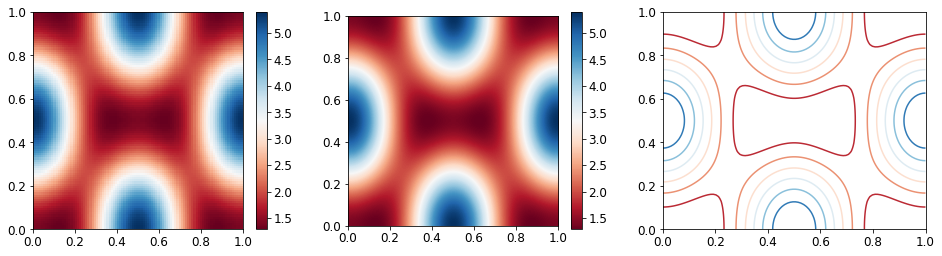

In [51]:
""" PY-26 Mapa kolorów i konturów """
from pylab import *
import numpy as np

alpha = 0.7
phi_ext = 2 * np.pi * 0.5

def flux_qubit_potential(phi_m, phi_p):
    return 2 + alpha - 2 * np.cos(phi_p) * np.cos(phi_m) - alpha * np.cos(phi_ext - 2*phi_p)

phi_m = np.linspace(0, 2*np.pi, 100)
phi_p = np.linspace(0, 2*np.pi, 100)
X,Y = np.meshgrid(phi_p, phi_m)
Z = flux_qubit_potential(X, Y).T


fig, ax = plt.subplots(1,3,figsize=(16,4))

p = ax[0].pcolor(X/(2*np.pi), Y/(2*np.pi), Z, cmap=matplotlib.cm.RdBu, vmin=abs(Z).min(), vmax=abs(Z).max())
cb = fig.colorbar(p, ax=ax[0])

im = ax[1].imshow(Z, cmap=matplotlib.cm.RdBu, vmin=abs(Z).min(), vmax=abs(Z).max(), extent=[0, 1, 0, 1])
im.set_interpolation('bilinear')
cb = fig.colorbar(im, ax=ax[1])

cnt = ax[2].contour(Z, cmap=matplotlib.cm.RdBu, vmin=abs(Z).min(), vmax=abs(Z).max(), extent=[0, 1, 0, 1])

## <a name="et12"></a>Wykresy 3D 

Do wykresów trójwymiarowych stosujemy klase Axes3D z biblioteki mpl_toolkits.mplot3d.axes3d. Utworzony obiekt tej klasy dodajemy do "płótna" matplotlib zaznaczając tylko opcję `projection='3d'`. Oto przyklad (metoda `plot_surface`): 

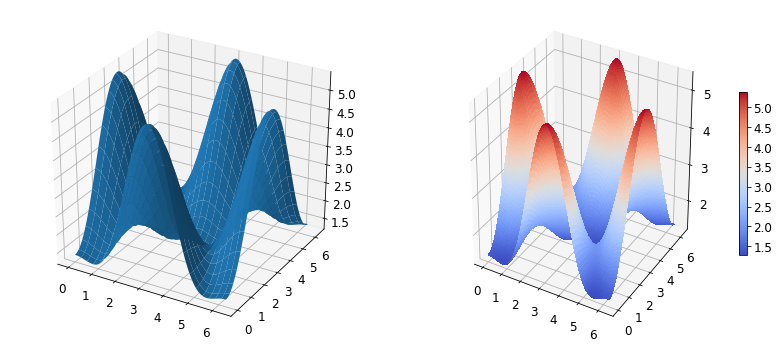

In [52]:
""" PY-27 Wykresy 3D """
from mpl_toolkits.mplot3d.axes3d import Axes3D
fig = plt.figure(figsize=(14,6))

# `ax` is a 3D-aware axis instance because of the projection='3d' keyword argument to add_subplot
ax = fig.add_subplot(1, 2, 1, projection='3d')

p = ax.plot_surface(X, Y, Z, rstride=4, cstride=4, linewidth=0)

# surface_plot with color grading and color bar
ax = fig.add_subplot(1, 2, 2, projection='3d')
p = ax.plot_surface(X, Y, Z, rstride=1, cstride=1, cmap=matplotlib.cm.coolwarm, linewidth=0, antialiased=False)
cb = fig.colorbar(p, shrink=0.5)

a trzywymiarowy  "siatkowy" wykres uzyskujemy (metoda `plot_wireframe`):

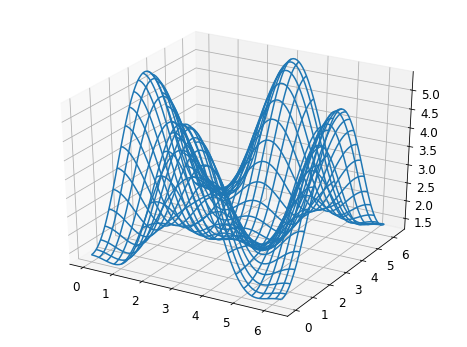

In [53]:
""" PY-28 Wykres typu wireframe"""
fig = plt.figure(figsize=(8,6))

ax = fig.add_subplot(1, 1, 1, projection='3d')

p = ax.plot_wireframe(X, Y, Z, rstride=4, cstride=4)

A to przykład metody `plot_surface` z rzutami na trzy płaszczyzny:

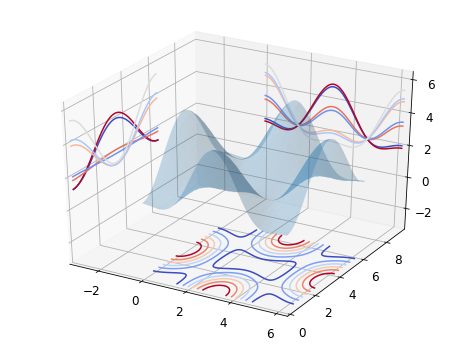

In [54]:
""" PY-29 Wykres 3D z rzutami"""
fig = plt.figure(figsize=(8,6))

ax = fig.add_subplot(1,1,1, projection='3d')

ax.plot_surface(X, Y, Z, rstride=4, cstride=4, alpha=0.25)
cset = ax.contour(X, Y, Z, zdir='z', offset=-np.pi, cmap=matplotlib.cm.coolwarm)
cset = ax.contour(X, Y, Z, zdir='x', offset=-np.pi, cmap=matplotlib.cm.coolwarm)
cset = ax.contour(X, Y, Z, zdir='y', offset=3*np.pi, cmap=matplotlib.cm.coolwarm)

ax.set_xlim3d(-np.pi, 2*np.pi);
ax.set_ylim3d(0, 3*np.pi);
ax.set_zlim3d(-np.pi, 2*np.pi);

Zmiana kąta widzenia polega na zastosowaniu metody `view_init` z dwoma kątami (w stopniach): `elevation` i `azimuth` 

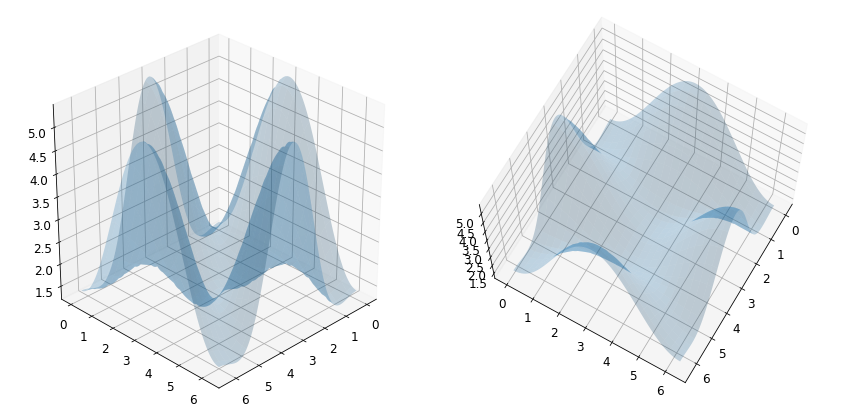

In [55]:
""" PY-30 Różne kąty widzenia figur 3D """
fig = plt.figure(figsize=(12,6))

ax = fig.add_subplot(1,2,1, projection='3d')
ax.plot_surface(X, Y, Z, rstride=4, cstride=4, alpha=0.25)
ax.view_init(30, 45)

ax = fig.add_subplot(1,2,2, projection='3d')
ax.plot_surface(X, Y, Z, rstride=4, cstride=4, alpha=0.25)
ax.view_init(70, 30)

fig.tight_layout()

### <a name="et13"></a>Animacje

Matplotlib dostarcza również proste API do generowania animacji ciągu rysunkow. Służy do tego funkcja `FuncAnimation` z modułu `matplotlib.animation`. Funkcja ta przyjmuje następujące argumenty: `fig` - rysunek, `func`- funkcja opisująca zmiany rysunku w czasie, `init_func` - funkcja dostarczająca setupy rysunku, `frame`- liczba generowanych ramek, `blit` - wartość która mowi czy zmieniać tylko wymaganą część rysunku (dla płynniejszej animacji)  

Ze względy na przeglądarkę animacja w JUPYTERze jest ograniczona, i musi być wyświetlana na przykład prez polecenie 

**plt.rcParams\["animation.html"\] = "jshtml"**

a jądro dobrze jest zrestartować do następnej animacji. 
Zawsze ufekt animacji możemy nagrać w ruchomym gifie. 

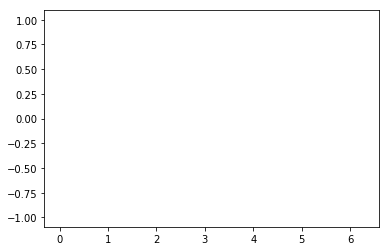

In [56]:
""" PY-31 Animacja prostej funkcji sinus"""
%matplotlib inline
import matplotlib.pyplot as plt
plt.rcParams["animation.html"] = "jshtml"
import matplotlib.animation
import numpy as np

t = np.linspace(0,2*np.pi)
x = np.sin(t)

fig, ax = plt.subplots()
l, = ax.plot([0,2*np.pi],[-1,1])

animate = lambda i: l.set_data(t[:i], x[:i])

ani = matplotlib.animation.FuncAnimation(fig, animate, frames=len(t))
ani

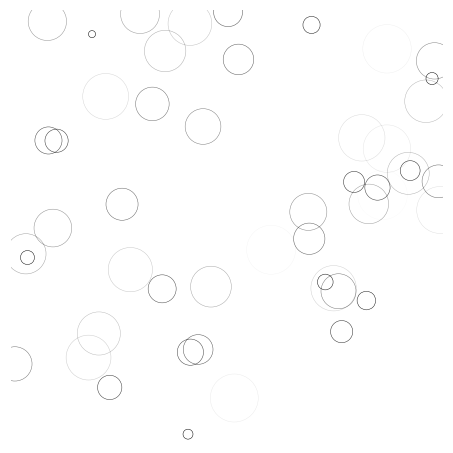

In [1]:
""" PY-32 Animacja pojawiających się losowo baniek"""
%matplotlib inline
import matplotlib.pyplot as plt
plt.rcParams["animation.html"] = "jshtml"
import matplotlib.animation
import numpy as np


fig = plt.figure(figsize=(6,6), facecolor='white')
ax = fig.add_axes([0,0,1,1], frameon=False, aspect=1)
n = 50
size_min = 50
size_max = 50*50
P = np.random.uniform(0,1,(n,2))
C = np.ones((n,4)) * (0,0,0,1)
C[:,3] = np.linspace(0,1,n)
S = np.linspace(size_min, size_max, n)
scat = ax.scatter(P[:,0], P[:,1], s=S, lw = 0.5,
                  edgecolors = C, facecolors='None')
ax.set_xlim(0,1), ax.set_xticks([])
ax.set_ylim(0,1), ax.set_yticks([])

def update(frame):
    global P, C, S

    # Every ring is made more transparent
    C[:,3] = np.maximum(0, C[:,3] - 1.0/n)

    # Each ring is made larger
    S += (size_max - size_min) / n

    # Reset ring specific ring (relative to frame number)
    i = frame % 50
    P[i] = np.random.uniform(0,1,2)
    S[i] = size_min
    C[i,3] = 1

    # Update scatter object
    scat.set_edgecolors(C)
    scat.set_sizes(S)
    scat.set_offsets(P)

    return scat,

ani = matplotlib.animation.FuncAnimation(fig, update, frames=200)
# animation.save('rain.gif', writer='imagemagick', fps=30, dpi=40)
ani


### Matplotlib 

umożliwia też tworzenie interaktywnych (możemy wykonywać pewne operacje myszką) wykresów. 

### <a name="et14"></a>Jeszcze parę przykladów zastosowania bibliteki MATPLOTLIB

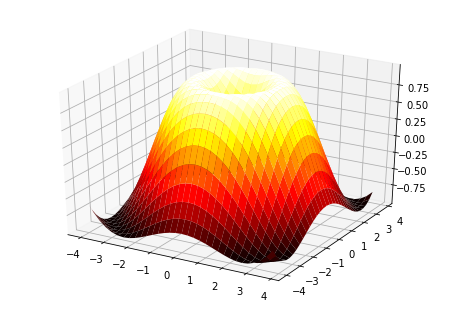

In [58]:
""" PY 33 Prosty wykres 3D """
%matplotlib inline
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure()
ax = Axes3D(fig)
X = np.arange(-4, 4, 0.25)
Y = np.arange(-4, 4, 0.25)
X, Y = np.meshgrid(X, Y)
R = np.sqrt(X**2 + Y**2)
Z = np.sin(R)

ax.plot_surface(X, Y, Z, rstride=1, cstride=1, cmap='hot')


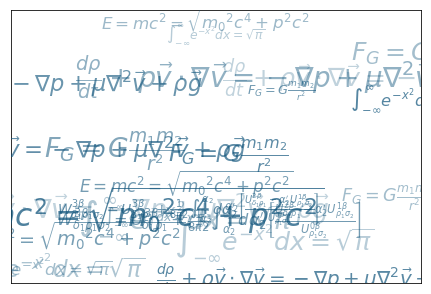

In [59]:
""" PY-34 Napisy w losowych miejscach"""
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt


eqs = []
eqs.append((r"$W^{3\beta}_{\delta_1 \rho_1 \sigma_2} = U^{3\beta}_{\delta_1 \rho_1} + \frac{1}{8 \pi 2} \int^{\alpha_2}_{\alpha_2} d \alpha^\prime_2 \left[\frac{ U^{2\beta}_{\delta_1 \rho_1} - \alpha^\prime_2U^{1\beta}_{\rho_1 \sigma_2} }{U^{0\beta}_{\rho_1 \sigma_2}}\right]$"))
eqs.append((r"$\frac{d\rho}{d t} + \rho \vec{v}\cdot\nabla\vec{v} = -\nabla p + \mu\nabla^2 \vec{v} + \rho \vec{g}$"))
eqs.append((r"$\int_{-\infty}^\infty e^{-x^2}dx=\sqrt{\pi}$"))
eqs.append((r"$E = mc^2 = \sqrt{{m_0}^2c^4 + p^2c^2}$"))
eqs.append((r"$F_G = G\frac{m_1m_2}{r^2}$"))

plt.axes([0.025, 0.025, 0.95, 0.95])

for i in range(24):
    index = np.random.randint(0, len(eqs))
    eq = eqs[index]
    size = np.random.uniform(12, 32)
    x,y = np.random.uniform(0, 1, 2)
    alpha = np.random.uniform(0.25, .75)
    plt.text(x, y, eq, ha='center', va='center', color="#11557c", alpha=alpha,
         transform=plt.gca().transAxes, fontsize=size, clip_on=True)
plt.xticks(())
plt.yticks(())

plt.show()

<a name="et15"></a>

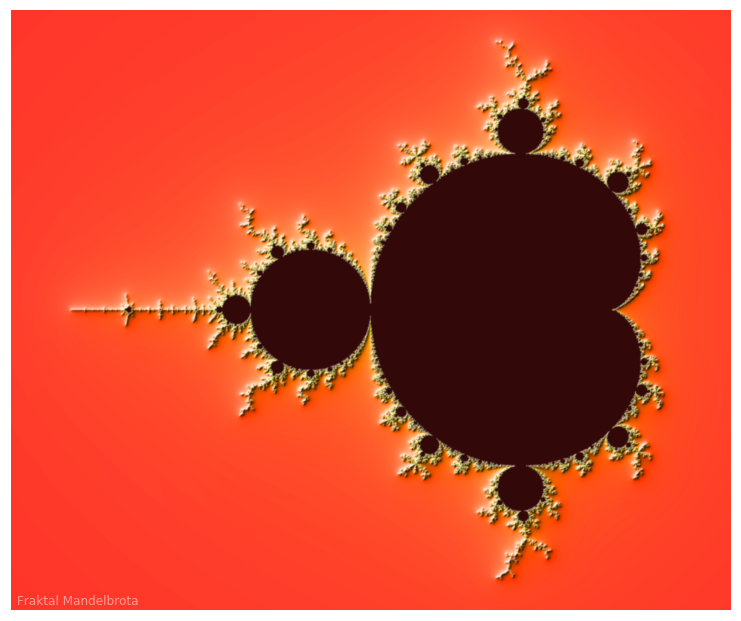

In [60]:
""" PY-35 Fraktal Mandelbrota: zmienna 'maxiter' daje precyzję obliczeń. 'maxiter=200' preferowane."""
import numpy as np
def mandelbrot_set(xmin, xmax, ymin, ymax, xn, yn, maxiter, horizon=2.0):
    X = np.linspace(xmin, xmax, int(xn), dtype=np.float32)
    Y = np.linspace(ymin, ymax, int(yn), dtype=np.float32)
    C = X + Y[:, None]*1j
    N = np.zeros(C.shape, dtype=int)
    Z = np.zeros(C.shape, np.complex64)
    for n in range(int(maxiter)):
        I = np.less(abs(Z), horizon)
        N[I] = n
        ###  RÓwnanie Mandelbrota
        Z[I] = Z[I]**2 + C[I]
    N[N == maxiter-1] = 0
    return Z, N


if __name__ == '__main__':
    import time
    import matplotlib
    from matplotlib import colors
    import matplotlib.pyplot as plt

    xmin, xmax, xn = -2.25, +0.75, 3000/2
    ymin, ymax, yn = -1.25, +1.25, 2500/2
    maxiter = 150
    horizon = 2.0 ** 40
    log_horizon = np.log(np.log(horizon))/np.log(2)
    Z, N = mandelbrot_set(xmin, xmax, ymin, ymax, xn, yn, maxiter, horizon)

    with np.errstate(invalid='ignore'):
        M = np.nan_to_num(N + 1 -
                          np.log(np.log(abs(Z)))/np.log(2) +
                          log_horizon)

    dpi = 72
    width = 10
    height = 10*yn/xn
    fig = plt.figure(figsize=(width, height), dpi=dpi)
    ax = fig.add_axes([0.0, 0.0, 1.0, 1.0], frameon=False, aspect=1)

    # Cieniowane renderowanie
    light = colors.LightSource(azdeg=315, altdeg=10)
    M = light.shade(M, cmap=plt.cm.hot, vert_exag=1.5,
                    norm=colors.PowerNorm(0.3), blend_mode='hsv')
    plt.imshow(M, extent=[xmin, xmax, ymin, ymax], interpolation="bicubic")
    ax.set_xticks([])
    ax.set_yticks([])

    year = time.strftime("%Y")
    major, minor, micro = matplotlib.__version__.split('.', 2)
    text = ("Fraktal Mandelbrota")            
    ax.text(xmin+.025, ymin+.025, text, color="white", fontsize=12, alpha=0.5)

    plt.show()

<a name="et16"></a>

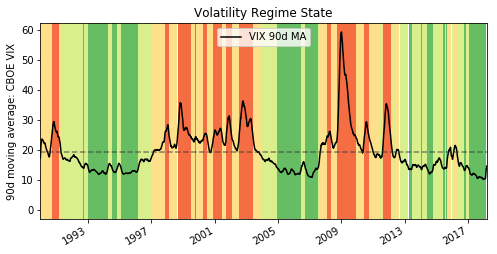

In [61]:
""" PY-36 Wykres giełdowy"""
%matplotlib inline
import pandas as pd
import matplotlib.transforms as mtransforms

url = 'https://fred.stlouisfed.org/graph/fredgraph.csv?id=VIXCLS'
vix = pd.read_csv(url, index_col=0, parse_dates=True, na_values='.',
                   infer_datetime_format=True,
                   squeeze=True).dropna()
ma = vix.rolling('90d').mean()
state = pd.cut(ma, bins=[-np.inf, 14, 18, 24, np.inf],
                labels=range(4))

cmap = plt.get_cmap('RdYlGn_r')
ma.plot(color='black', linewidth=1.5, marker='', figsize=(8, 4),
         label='VIX 90d MA')
ax = plt.gca()  # get the current Axes that ma.plot() references
ax.set_xlabel('')
ax.set_ylabel('90d moving average: CBOE VIX')
ax.set_title('Volatility Regime State')
ax.grid(False)
ax.legend(loc='upper center')
ax.set_xlim(xmin=ma.index[0], xmax=ma.index[-1])

trans = mtransforms.blended_transform_factory(ax.transData, ax.transAxes)
for i, color in enumerate(cmap([0.2, 0.4, 0.6, 0.8])):
    ax.fill_between(ma.index, 0, 1, where=state==i,
                    facecolor=color, transform=trans)
ax.axhline(vix.mean(), linestyle='dashed', color='xkcd:dark grey',
           alpha=0.6, label='Full-period mean', marker='')


###  <a name="et17"></a>Tabele kształtów i palety kolorów MATPLOTLIB

![Obraz1](Data/PYTHONI/PY-11.png)
![Obraz2](Data/PYTHONI/PY-12.png)
![Obraz3](Data/PYTHONI/PY-13.png)

## Dalszych informacji szukaj na:

* http://www.matplotlib.org - Web strona projektu matplotlib.
* https://github.com/matplotlib/matplotlib - Źródła matplotlib.
* http://matplotlib.org/gallery.html - Duża galeria przeykładów zastosowań matplotlib.
* http://www.loria.fr/~rougier/teaching/matplotlib - Dobry podręcznik matplotliba.
* http://scipy-lectures.github.io/matplotlib/matplotlib.html - Inny dobry podręcznik matplotliba.
